# **Data Loading**

In [ ]:
!pip install -q kaggle
from google.colab import files
files.upload()   # Upload kaggle.json from your Kaggle account
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d akhatova/pcb-defects
!unzip -q pcb-defects.zip -d ./pcb_defects

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
100% 1.88G/1.88G [00:18<00:00, 110MB/s]



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import os
import random
import re
import shutil
sns.set_style('darkgrid')
sns.set_palette('pastel')
import warnings
warnings.filterwarnings('ignore')


## **Understanding the dataset**

In [ ]:
input_dir= "pcb_defects/PCB_DATASET"
os.listdir(input_dir)

['rotation', 'Annotations', 'rotate.py', 'PCB_USED', 'images']

*  **PCB USED folder**- contains the 12 template images we used in the dataset.
* **images folder**- contains the PCB images subclassed into different types.
* **rotation folder**- contains the rotated PCB images subclassed into different types as well as rotation angle
* **annotations folder**- contains the annotations for bounding box of each images





## **Analyzing the PCB USED folder**

In [ ]:
template_dir=os.path.join(input_dir,'PCB_USED')
template_dir

'pcb_defects/PCB_DATASET/PCB_USED'

In [ ]:
#Creating function to visualize images:
def visualize_img(dir_name,nos_):
    k=1
    plt.figure(figsize=(8,(nos_//2)*6))
    for filename in os.listdir(dir_name)[0:nos_]:
        if filename.lower().endswith(('.jpg','.jpeg','.png')):
            ax=plt.subplot((nos_//2)+1,2,k)
            img_path=os.path.join(dir_name,filename)
            img=plt.imread(img_path)
            ax.imshow(img)
            ax.set_xlabel(filename)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])
            k+=1
    plt.tight_layout()
    plt.show()

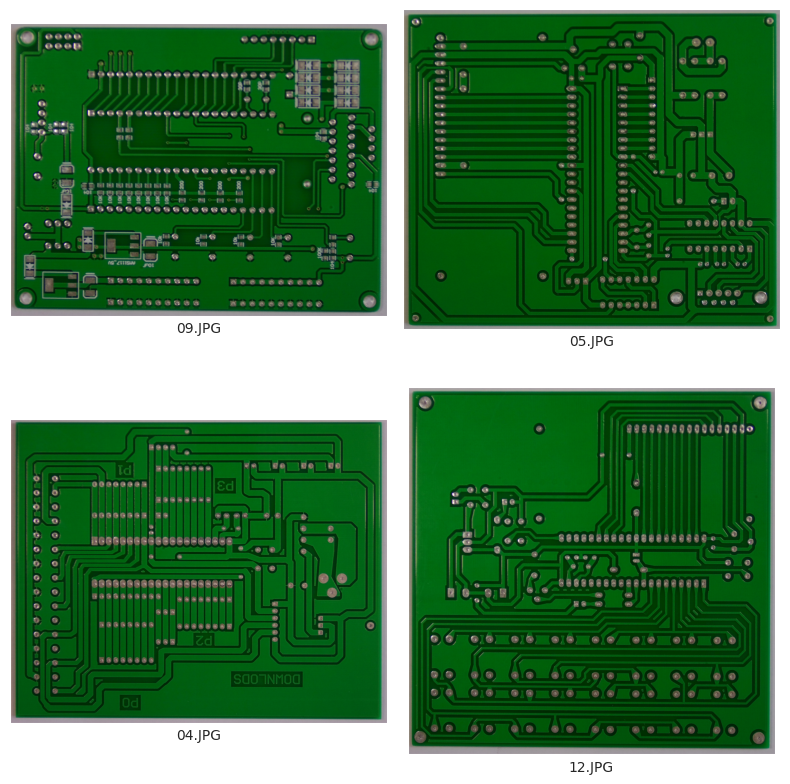

No of template images:10


In [ ]:
visualize_img(template_dir,nos_=4)

print(f'No of template images:{len(os.listdir(template_dir))}')

## **Analyzing the images folder**

In [ ]:
# Listing the types of defects
img_dir=os.path.join(input_dir,'images')
os.listdir(img_dir)
types_defect=os.listdir(os.path.join(input_dir,'images'))
types_defect

['Short',
 'Spur',
 'Mouse_bite',
 'Open_circuit',
 'Spurious_copper',
 'Missing_hole']

In [ ]:
# Creating img_path list
img_path_list=[]
for sub_cat in types_defect:
    for file in os.listdir(os.path.join(img_dir,sub_cat)):

        img_path_list.append(os.path.join(img_dir,sub_cat,file))


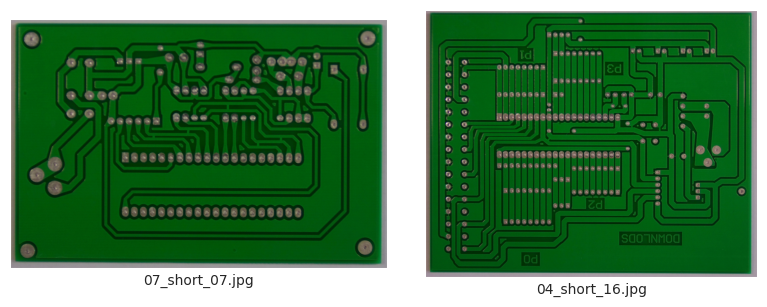

No of Short images:116


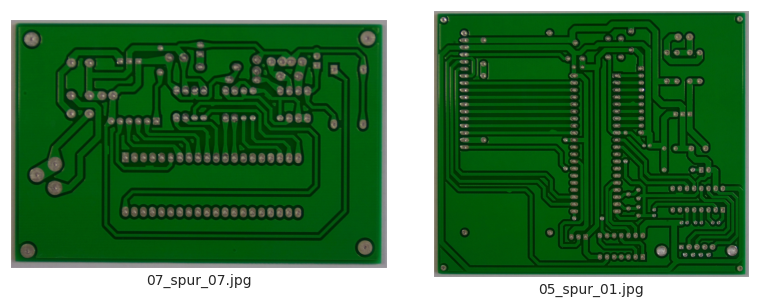

No of Spur images:115


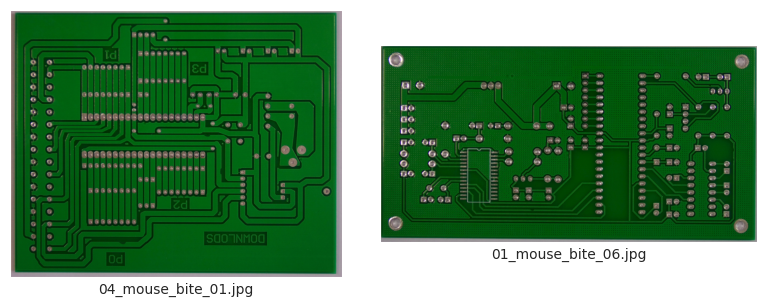

No of Mouse_bite images:115


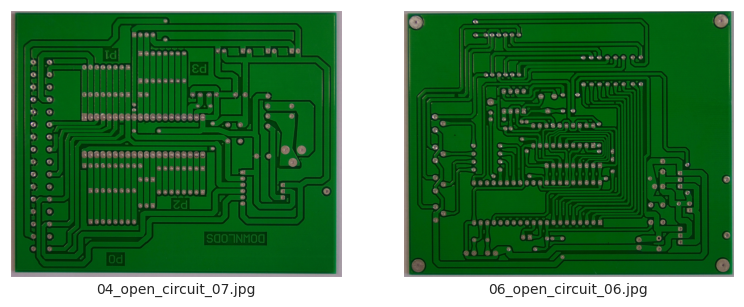

No of Open_circuit images:116


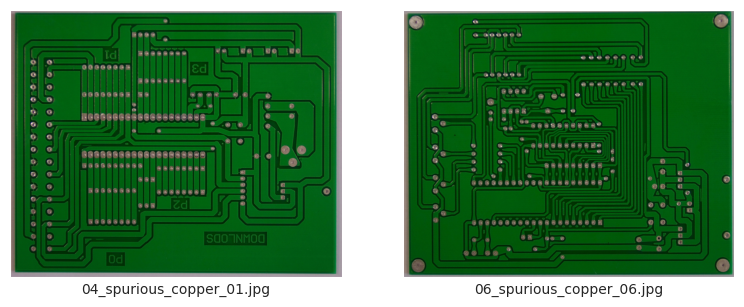

No of Spurious_copper images:116


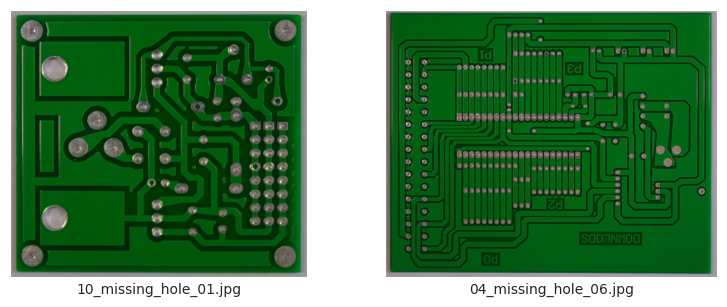

No of Missing_hole images:115


In [ ]:
# Vizualizing defect images for each type

df_defect=pd.DataFrame(columns=['No of defect']) # dataframe for counting no of defects
for sub_cat in types_defect:
    visualize_img(os.path.join(img_dir,sub_cat),nos_=2)  #Visualizing 2 types of defect for each type

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(img_dir,sub_cat)))}')

    df_defect.loc[sub_cat]=len(os.listdir(os.path.join(img_dir,sub_cat)))


In [ ]:
# No. of defects by type
df_defect

,No of defect
Short,116
Spur,115
Mouse_bite,115
Open_circuit,116
Spurious_copper,116
Missing_hole,115


## **Analyzing rotated folder**

In [ ]:
rotated_dir=os.path.join(input_dir,'rotation')
os.listdir(rotated_dir)

['Mouse_bite_rotation',
 'Short_angles.txt',
 'Spurious_copper_rotation',
 'Spur_rotation',
 'Spurious_copper_angles.txt',
 'Missing_hole_rotation',
 'Short_rotation',
 'Mouse_bite_angles.txt',
 'Missing_hole_angles.txt',
 'Open_circuit_angles.txt',
 'Open_circuit_rotation',
 'Spur_angles.txt']

In [ ]:
rotated_angle_list=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')]
rotated_angle_list

['Short_angles.txt',
 'Spurious_copper_angles.txt',
 'Mouse_bite_angles.txt',
 'Missing_hole_angles.txt',
 'Open_circuit_angles.txt',
 'Spur_angles.txt']

In [ ]:
types_defect_rotated=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')==False]
types_defect_rotated

['Mouse_bite_rotation',
 'Spurious_copper_rotation',
 'Spur_rotation',
 'Missing_hole_rotation',
 'Short_rotation',
 'Open_circuit_rotation']

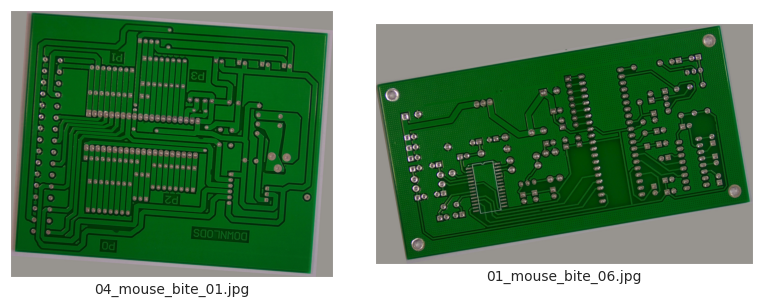

No of Mouse_bite_rotation images:115


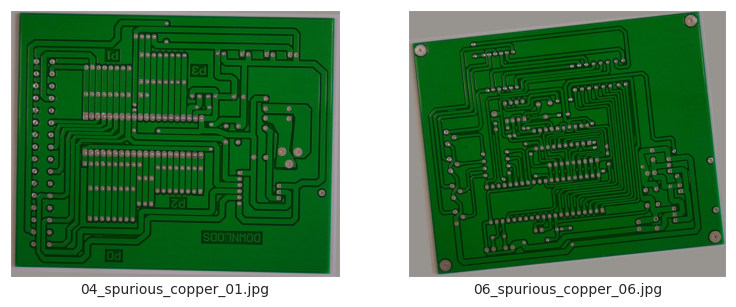

No of Spurious_copper_rotation images:116


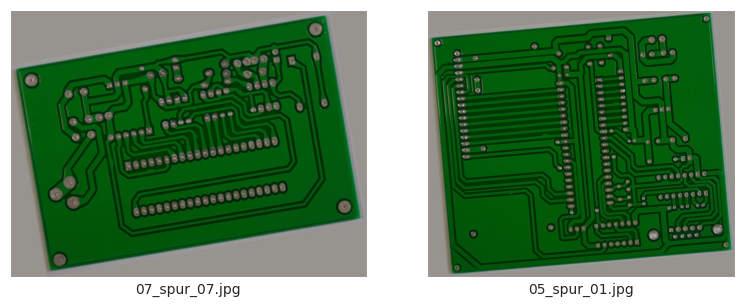

No of Spur_rotation images:115


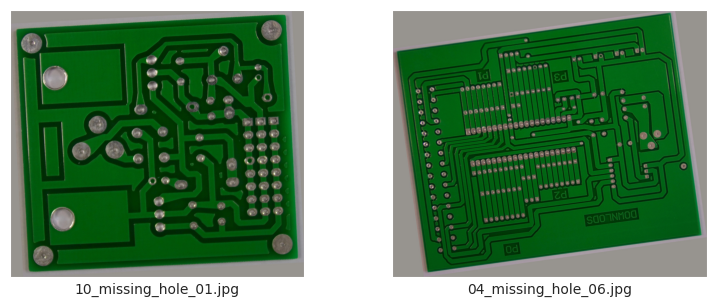

No of Missing_hole_rotation images:115


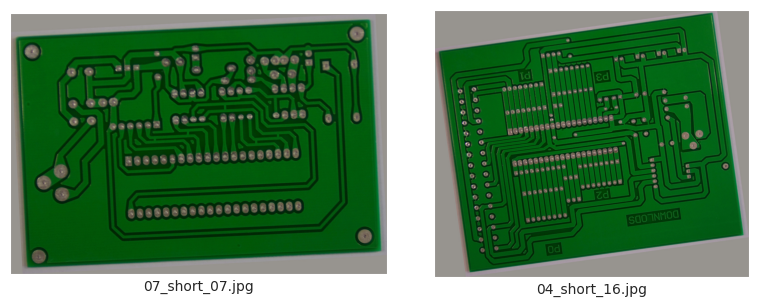

No of Short_rotation images:116


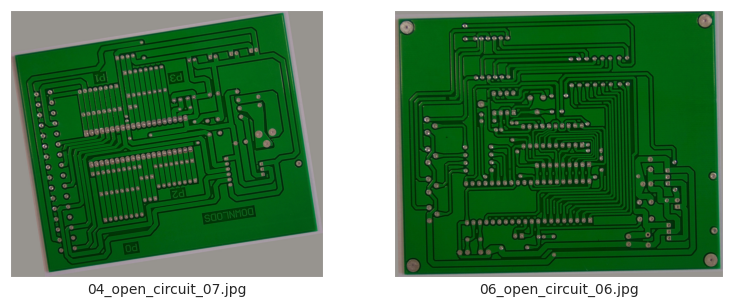

No of Open_circuit_rotation images:116


In [ ]:
# Vizualizing rotated defects
df_defect_rotated=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect_rotated:
    visualize_img(os.path.join(rotated_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(rotated_dir,sub_cat)))}')

    df_defect_rotated.loc[sub_cat]=len(os.listdir(os.path.join(rotated_dir,sub_cat)))

In [ ]:
# No. of defects by type  rotated
df_defect_rotated

,No of defect
Mouse_bite_rotation,115
Spurious_copper_rotation,116
Spur_rotation,115
Missing_hole_rotation,115
Short_rotation,116
Open_circuit_rotation,116


In [ ]:
# Reading the rotation text files

df_rotation_angle=pd.DataFrame(columns=['Line','Angle'])
for filename in rotated_angle_list:
    with open(os.path.join(rotated_dir,filename),'r') as f:
        lines=f.readlines()
        for line in lines:
            text,angle=line.split()
            df_rotation_angle=pd.concat([df_rotation_angle,pd.DataFrame({'Line':[text],'Angle':[angle]})],axis=0)


In [ ]:
df_rotation_angle

,Line,Angle
0,04_short_06,4
0,08_short_01,-8
0,06_short_08,1
0,06_short_07,-3
0,01_short_08,-3
...,...,...
0,04_spur_10,-2
0,04_spur_18,5
0,04_spur_09,9
0,10_spur_02,2


## **Analyzing the annotate folder**

In [ ]:
annote_dir=os.path.join(input_dir,'Annotations')
annote_dir

'pcb_defects/PCB_DATASET/Annotations'

In [ ]:
type_annot=os.listdir(annote_dir)
type_annot

['Short',
 'Spur',
 'Mouse_bite',
 'Open_circuit',
 'Spurious_copper',
 'Missing_hole']

In [ ]:
# Checking the length of annotation items

df_annot_nos=pd.DataFrame(columns=['No of annotations'])
for i in type_annot:
    df_annot_nos.loc[i]=len(os.listdir(os.path.join(annote_dir,i)))
df_annot_nos

,No of annotations
Short,116
Spur,115
Mouse_bite,115
Open_circuit,116
Spurious_copper,116
Missing_hole,115


We see that we have an annotation file for each image

In [ ]:
# Checking the type of files
file_list=os.listdir(os.path.join(annote_dir,'Mouse_bite'))
file_list[0:5]

['05_mouse_bite_07.xml',
 '01_mouse_bite_07.xml',
 '04_mouse_bite_10.xml',
 '04_mouse_bite_06.xml',
 '07_mouse_bite_10.xml']

We see that all files are in XML format, so we have to parse the data

In [ ]:
# importing xml ET to parse xml file

import xml.etree.ElementTree as ET
tree = ET.parse(os.path.join(os.path.join(annote_dir,'Mouse_bite'),'01_mouse_bite_11.xml'))
root = tree.getroot()


In [ ]:
# Getting the structure of XML file
print(ET.tostring(root, encoding='utf8').decode('utf8'))

<?xml version='1.0' encoding='utf8'?>
<annotation>
	<folder>Mouse_bite</folder>
	<filename>01_mouse_bite_11.jpg</filename>
	<path>/home/weapon/Desktop/PCB_DATASET/Mouse_bite/01_mouse_bite_11.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>3034</width>
		<height>1586</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1199</xmin>
			<ymin>966</ymin>
			<xmax>1234</xmax>
			<ymax>1004</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>2042</xmin>
			<ymin>755</ymin>
			<xmax>2073</xmax>
			<ymax>786</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1472</xmin>
			<ymin>607</ymin>
		

In [ ]:
# Parsing XML to return Bounding box dimensions
def parse_xml(xml_file):

    data=[]

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    for obj in root.findall('object'):
        name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)

        data.append({
            'filename': filename,
            'width': width,
            'height': height,
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    return data

In [ ]:
# Retrieving data for all files
data=[]
all_data=[]

for x in type_annot:
    for file in os.listdir(os.path.join(annote_dir,x)):
        xml_file_path=os.path.join(os.path.join(annote_dir,x),file)
        data=parse_xml(xml_file_path)
        all_data.extend(data)


In [ ]:
# Creating a dataframe to store the annotations
df_annot=pd.DataFrame(all_data)
df_annot

,filename,width,height,class,xmin,ymin,xmax,ymax
0,04_short_11.jpg,3056,2464,short,444,1324,550,1422
1,04_short_11.jpg,3056,2464,short,830,1130,906,1210
2,04_short_11.jpg,3056,2464,short,2050,655,2197,766
3,01_short_04.jpg,3034,1586,short,1984,1227,2057,1287
4,01_short_04.jpg,3034,1586,short,2205,1135,2281,1218
...,...,...,...,...,...,...,...,...
2948,07_missing_hole_07.jpg,2904,1921,missing_hole,423,300,517,389
2949,07_missing_hole_07.jpg,2904,1921,missing_hole,563,688,655,777
2950,07_missing_hole_07.jpg,2904,1921,missing_hole,137,1153,273,1269
2951,07_missing_hole_07.jpg,2904,1921,missing_hole,2110,726,2187,813


In [ ]:
import os
import shutil

# Path to the main images folder in Colab (already uploaded)
img_dir = "/content/pcb_defects/PCB_DATASET/images"


source_dirs = [
    os.path.join(img_dir, "Missing_hole"),
    os.path.join(img_dir, "Mouse_bite"),
    os.path.join(img_dir, "Open_circuit"),
    os.path.join(img_dir, "Short"),
    os.path.join(img_dir, "Spur"),
    os.path.join(img_dir, "Spurious_copper")
]

# Define the destination directory for the combined images
destination_dir = "/content/images_combined"

os.makedirs(destination_dir, exist_ok=True)

# Loop through each source directory and copy all files to the destination
for source_dir in source_dirs:
    if os.path.exists(source_dir):
        files = os.listdir(source_dir)
        for file in files:
            file_path = os.path.join(source_dir, file)
            if os.path.isfile(file_path):
                shutil.copy(file_path, destination_dir)
    else:
        print(f"Directory {source_dir} does not exist.")


In [ ]:
# Now check how many files are in the destination folder
files_in_combined = os.listdir(destination_dir)
print(f"Number of files copied: {len(files_in_combined)}")

Number of files copied: 693


In [ ]:
destination_dir

'/content/images_combined'

Text(0.5, 0, 'No of defects in one PCB')

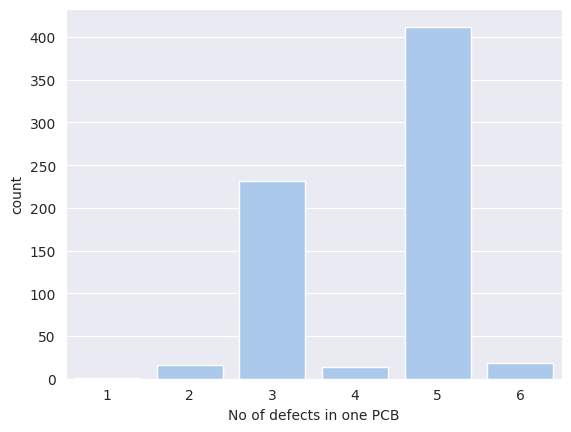

In [ ]:
# Visualizing the no of defects in each pcb
df_multiple_defects=pd.DataFrame(df_annot['filename'].value_counts())
sns.countplot(df_multiple_defects,x='count')
plt.xlabel('No of defects in one PCB')

## **Applying Bounding Boxes**

In [ ]:
# Defining a function to view image along with bounding box
# Draws multiple bounding boxes on an image using Matplotlib.

def draw_bounding_boxes(image_path, bounding_boxes,annotation):

    # Load the image
    img = plt.imread(image_path)

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(15,10))
    ax.imshow(img)

    # Draw each bounding box
    for bbox in bounding_boxes:
        min_x, min_y, max_x, max_y = bbox
        width = max_x - min_x
        height = max_y - min_y
        rect = patches.Rectangle((min_x, min_y), width, height, linewidth=1, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Calculate the centroid of the bounding box
        centroid_x = (min_x + max_x) / 2
        centroid_y = (min_y + max_y) / 2

        # Add the annotation to the centroid
        ax.annotate( annotation,(centroid_x,centroid_y),(max_x+20,max_y+20),
            fontsize=10,color='white',
            horizontalalignment='right', verticalalignment='top')

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    # Show the plot
    plt.show()


In [ ]:
# Getting filename from filepath
filepath=img_path_list[0]
filename=re.sub(r'.+/([\w_]+\.jpg)',r'\1',filepath)
filename

'07_short_07.jpg'

In [ ]:
def visualize_annotations(list_image_path, df):
    for i in list_image_path:
        filepath = i
        filename = re.sub(r'.+/([\w_]+\.jpg)', r'\1', filepath)
        df_selected = df[df['filename'] == filename]
        width  = df_selected['width'].values
        height = df_selected['height'].values

        # check if 'class' or 'class_name' exists
        if 'class_name' in df_selected.columns:
            class_name = df_selected['class_name'].values
        elif 'class' in df_selected.columns:
            class_name = df_selected['class'].values
        else:
            raise KeyError("No class column found in dataframe")

        xmin = df_selected['xmin'].values
        ymin = df_selected['ymin'].values
        xmax = df_selected['xmax'].values
        ymax = df_selected['ymax'].values

        bbox = zip(xmin, ymin, xmax, ymax)
        draw_bounding_boxes(filepath, bbox, class_name[0])


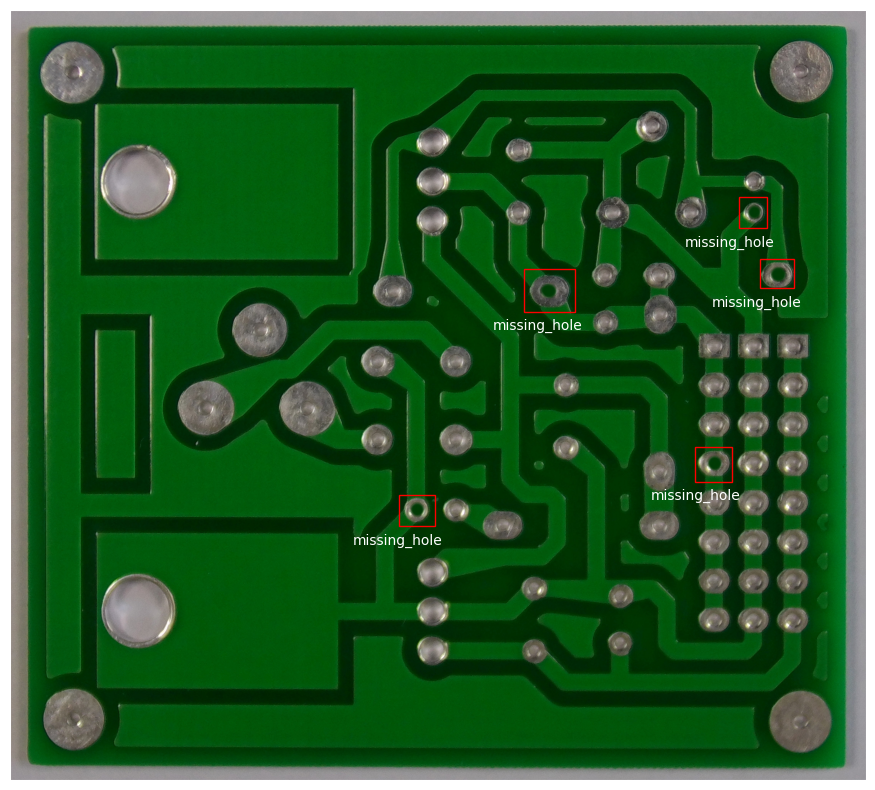

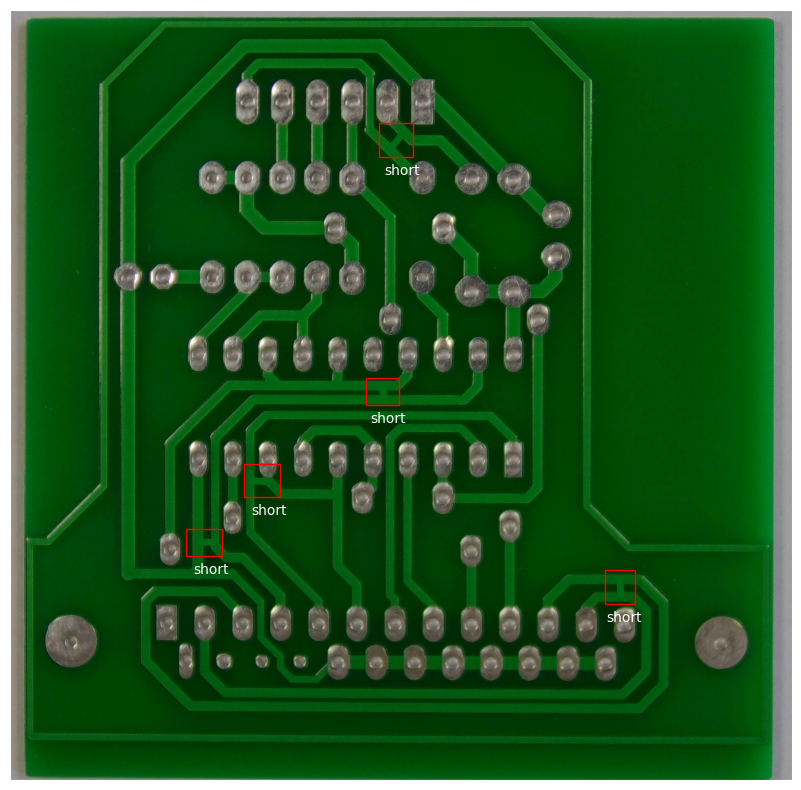

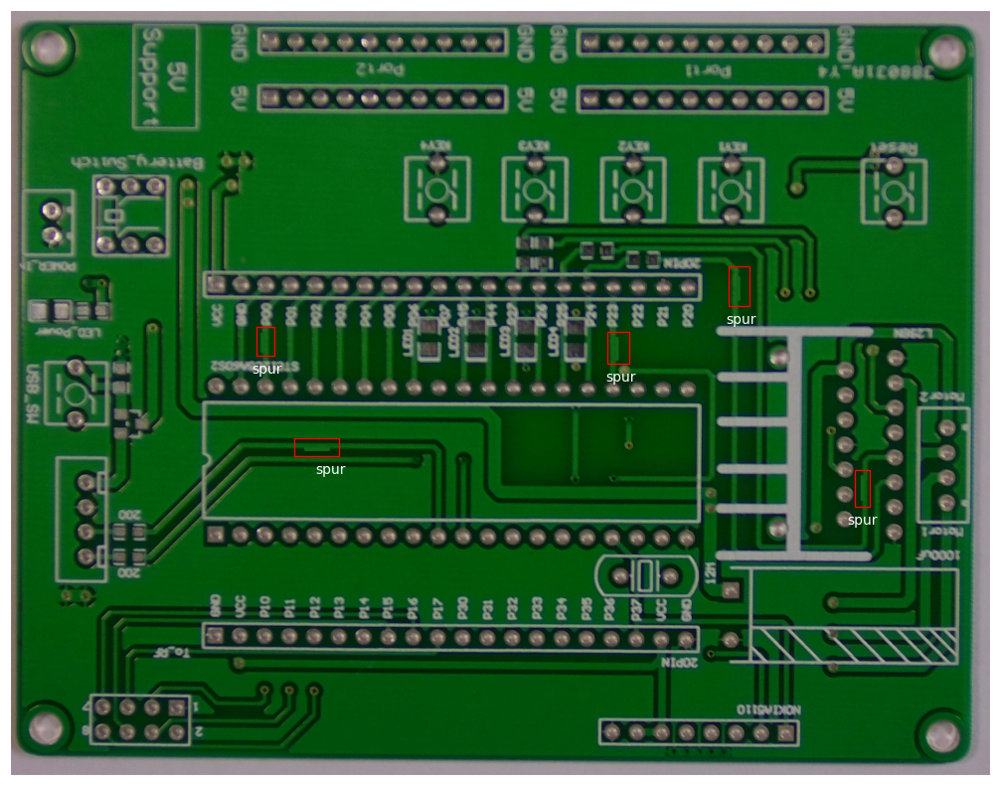

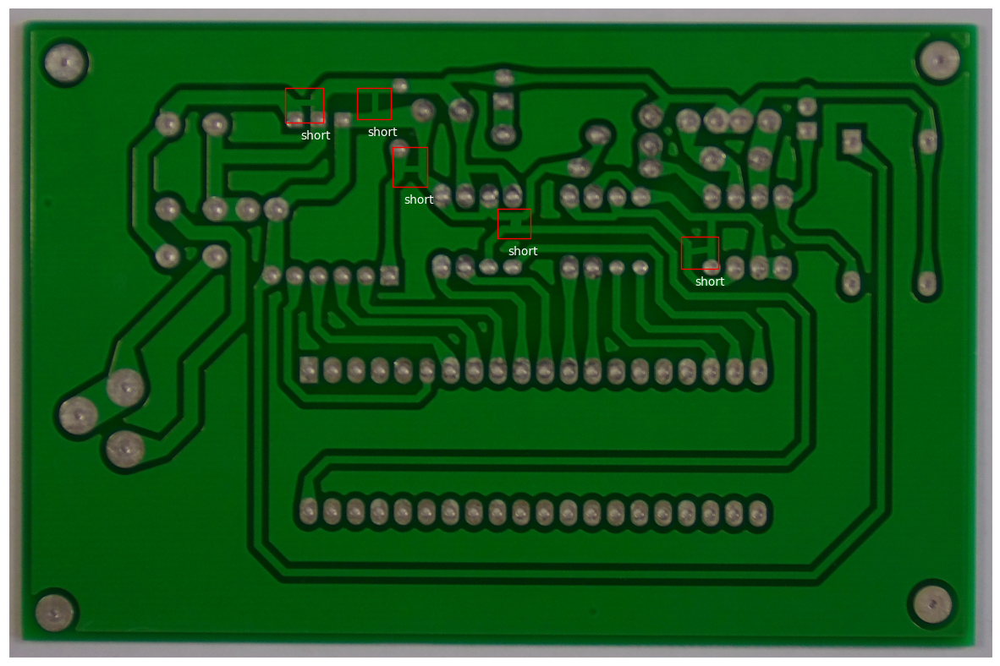

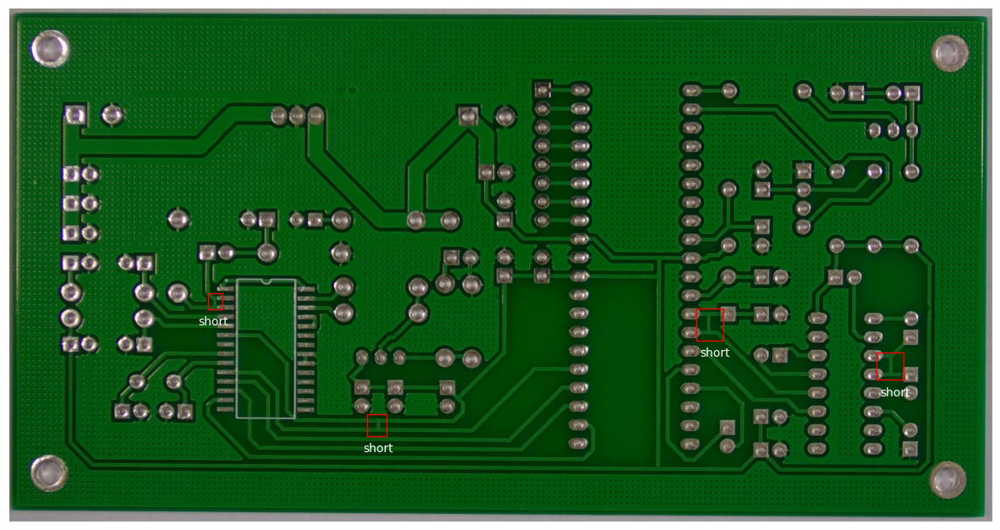

In [ ]:
image_path_shuffle=img_path_list
random.shuffle(image_path_shuffle)

visualize_annotations(image_path_shuffle[0:5],df_annot)